In [ ]:
# mount drive if needed
from google.colab import drive
drive.mount('/gdrive')
# CD to your working directory to upload images

Mounted at /gdrive


# Usage
In this notebook, we provide an example of how to use the langrs package using an image and a text input.


*   The image input is provided as a tif file, and the text input is the object to be segmented in the provided aerial image.

*   Grounding Dino is used first to provide bounding boxes for the object specified in the text input

* Outlier rejection is then applied to the resulting bounding boxes to filter out the non-homogenous sized bounding boxes.

* Segment Anything Model (SAM) is then used to produce the segmentation masks, utilizing the boudnding boxes resulting from the previous steps.

* Finally, visualization is provided to both our segmentation output and the segmentation output of the SamGeo output. A qualitative anlysis shows that the techniques deployed in our approach achieves better results in a setting where objects of homogenous sizes are to be segmented.





Install the package using pip

In [ ]:
!pip install langrs --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.8/152.8 kB 15.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 65.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.8/73.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━

Import LangRS class from the langrs package

In [ ]:
from langrs.core import LangRS

**Initialize an instance of the class, 3 main inputs are required when an instance is to be initiated:**

1. image: String that indicates the path to the input Tiff file.
2. prompt: A string representing the object of interest that needs to be segmented in the aerial image.
3. output_path: An output folder path, a folder with a timestamp will be created in this folder which will hold all the plots.

In [ ]:
image_path = 'roi_kala.tif'
prompt = 'roof'
output_path = 'output'
seg_params = {"box_threshold": 0.25, "text_threshold": 0.25}

In [ ]:
model = LangRS(image=image_path, prompt=prompt, output_path=output_path)

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:13<00:00, 196MB/s]


In [ ]:
input_image = model.pil_image

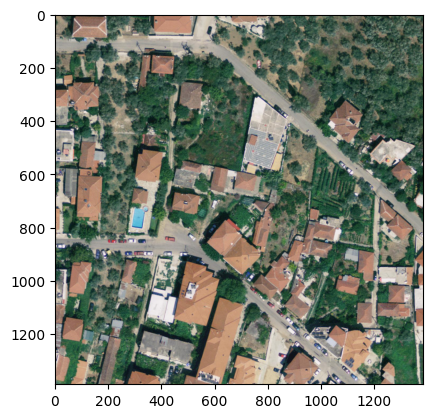

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(input_image)
plt.show()

In [ ]:
bounding_boxes = model.predict_dino(window_size=600, overlap=300, **seg_params)

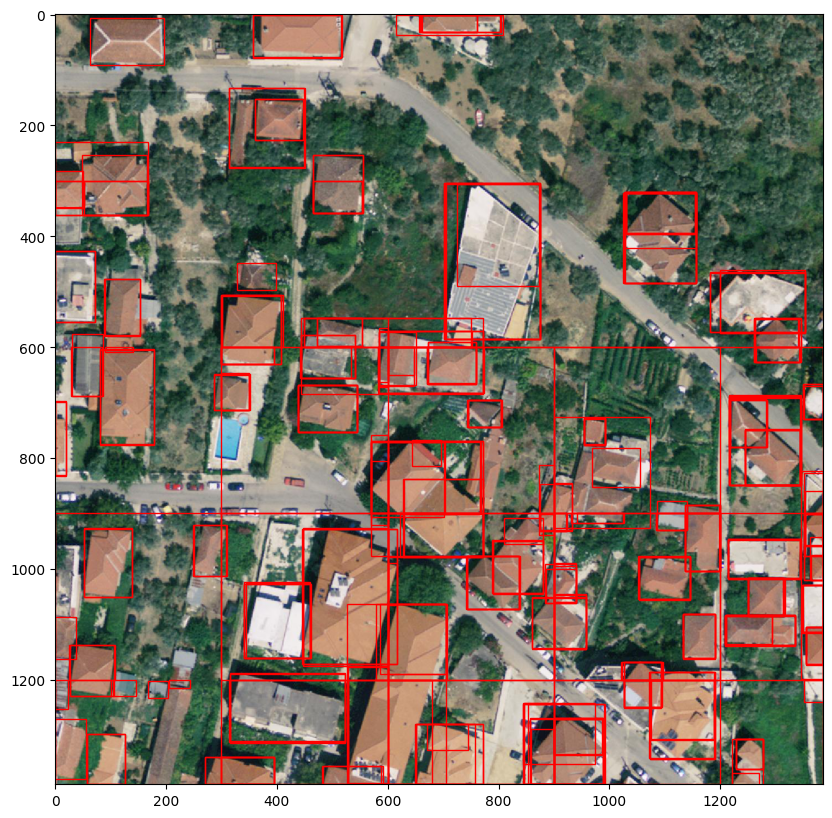

In [ ]:
from matplotlib.patches import Rectangle

# Plot boudning boxes as rectangles
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(input_image)

for box in bounding_boxes:
  x_min, y_min, x_max, y_max = box
  width = x_max - x_min
  height = y_max - y_min
  rect = Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
  ax.add_patch(rect)

plt.show()

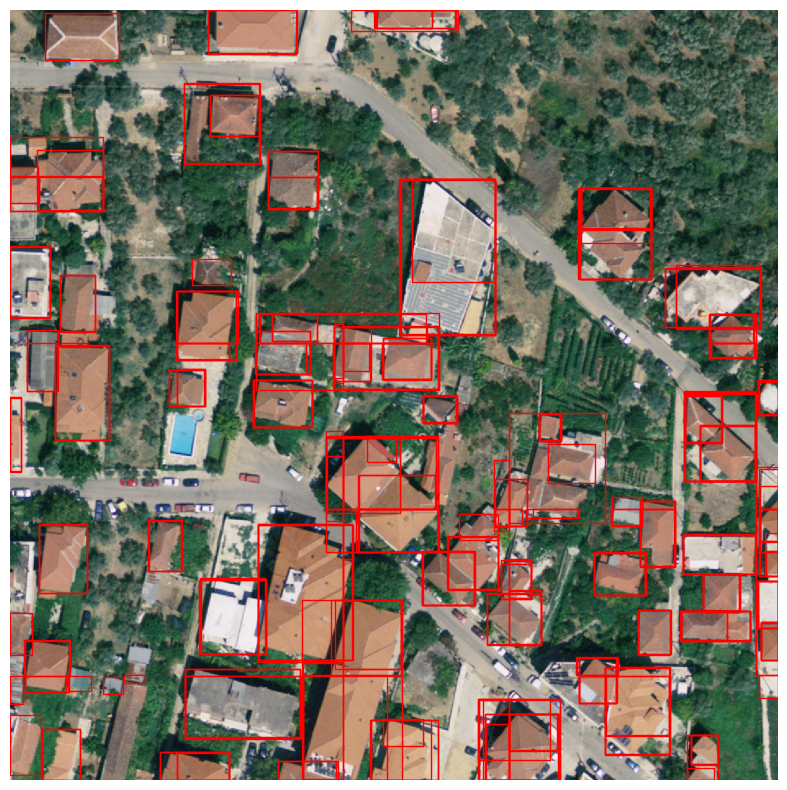

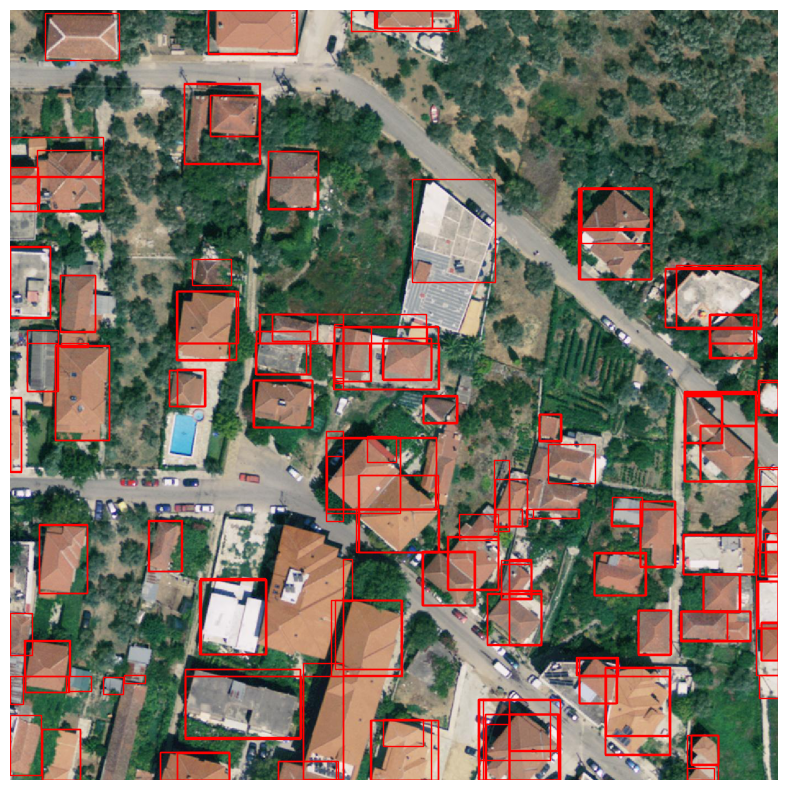

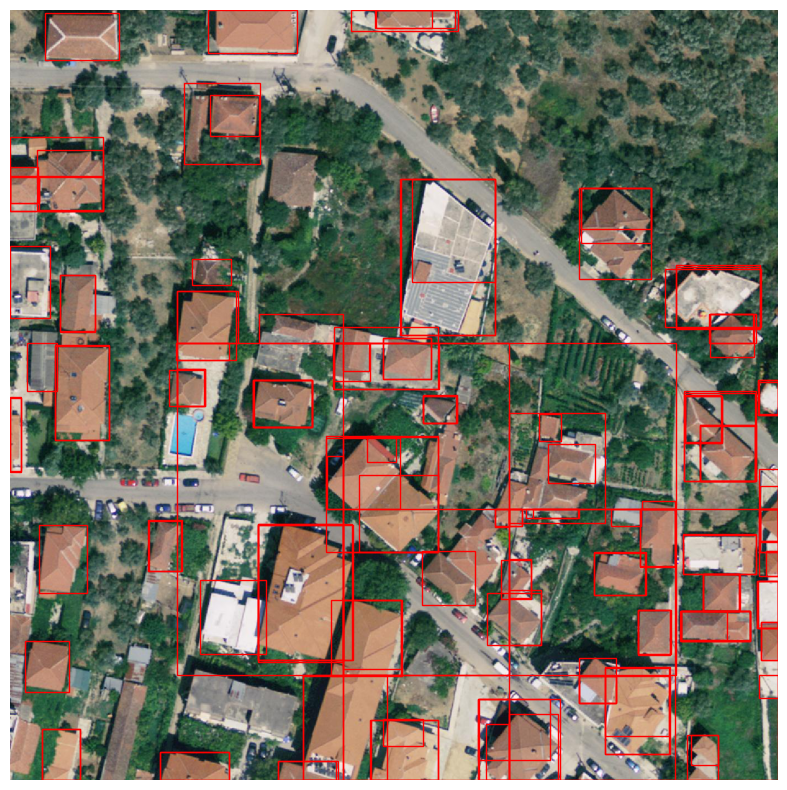

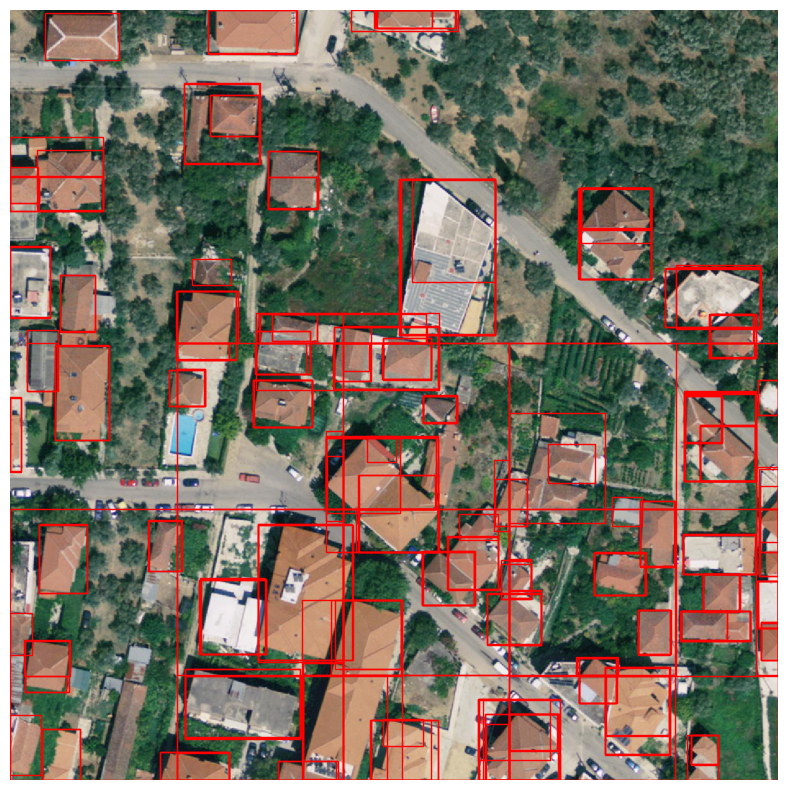

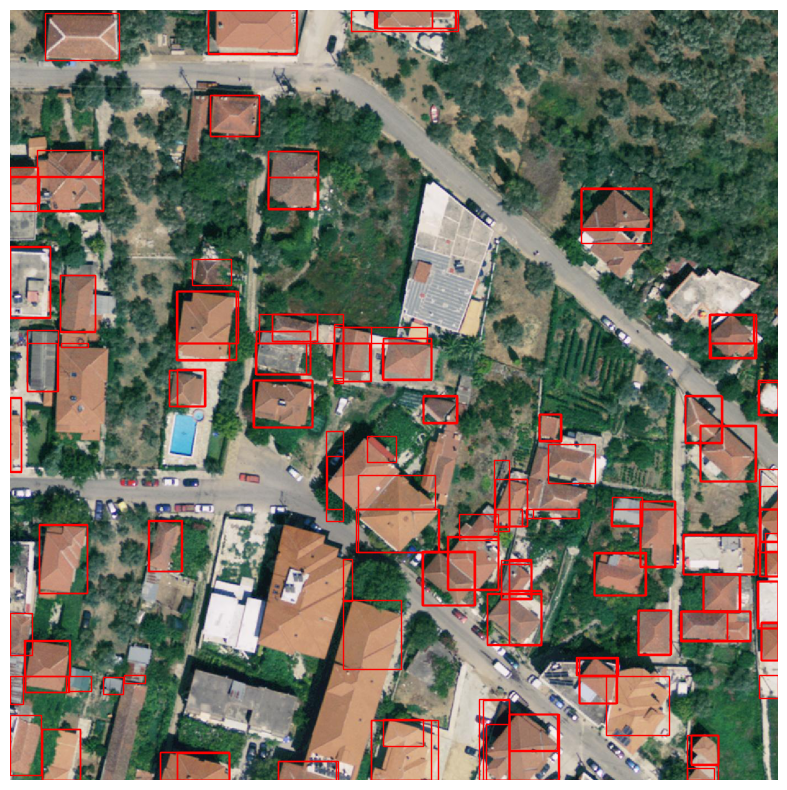

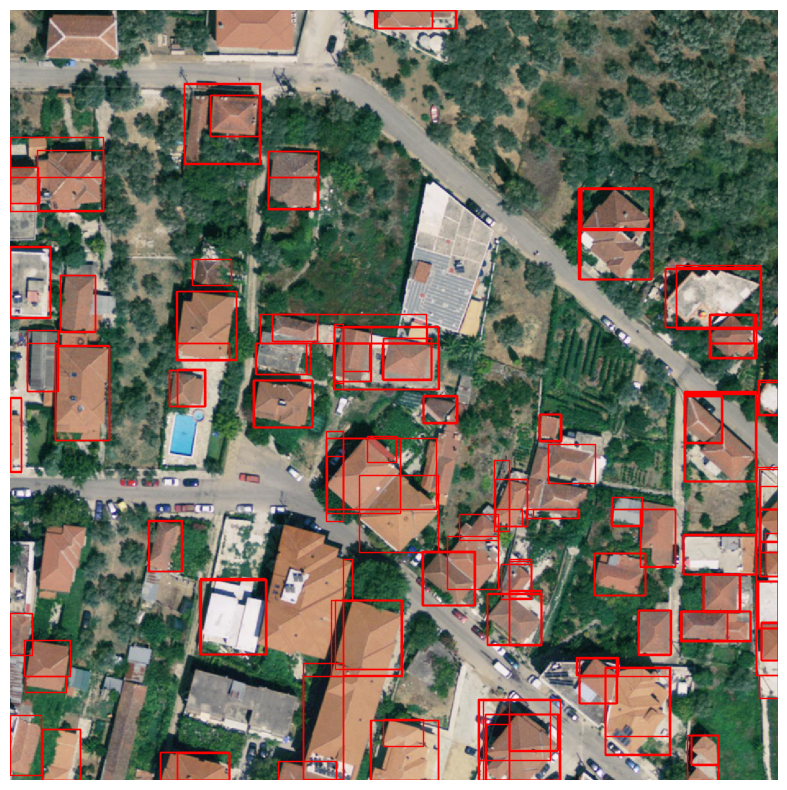

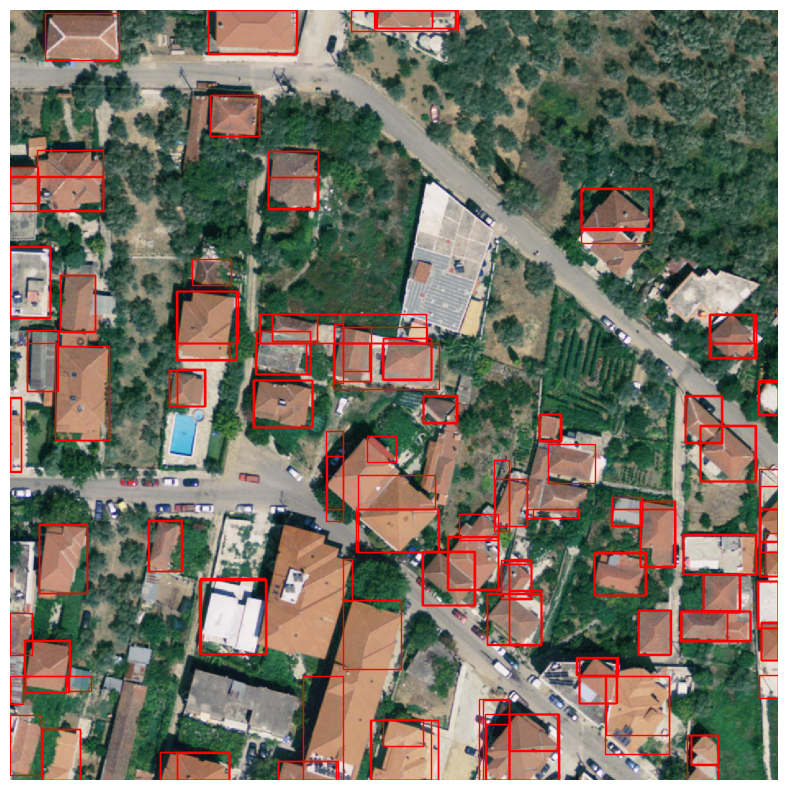

In [ ]:
bboxes_filtered = model.outlier_rejection()

In [ ]:
bboxes_filtered.keys()

dict_keys(['zscore', 'iqr', 'svm', 'svm_sgd', 'robust_covariance', 'lof', 'isolation_forest'])

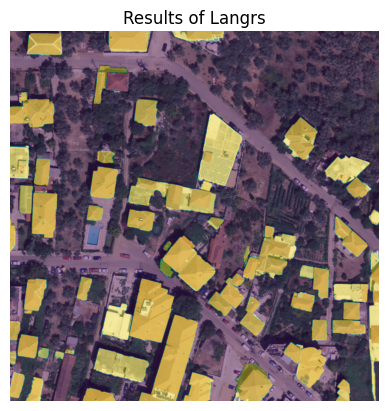

In [ ]:
masks = model.predict_sam(rejection_method="zscore")

fig, ax = plt.subplots()
ax.imshow(input_image)
ax.imshow(masks, cmap="viridis", alpha=0.4)
ax.axis('off')  # Turn off the axes

# Save the figure with tight bounding box to remove whitespace
plt.title("Results of Langrs")
plt.show()

In [ ]:
from samgeo.text_sam import LangSAM
samgeo = LangSAM()

final text_encoder_type: bert-base-uncased


In [ ]:
samgeo.predict(image_path, prompt, **seg_params)

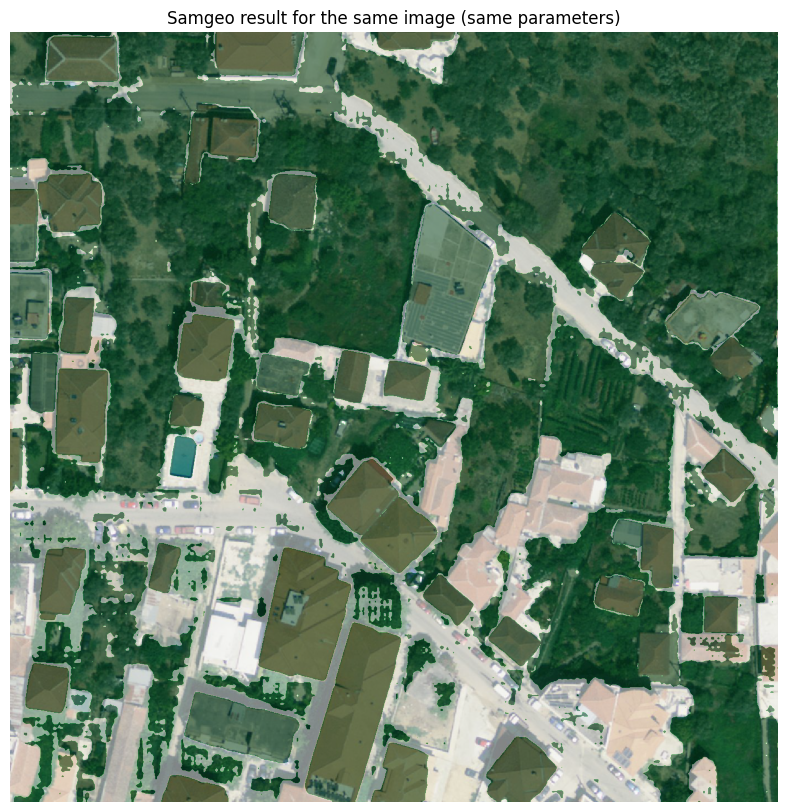

In [ ]:
samgeo.show_anns(
    cmap="Greens",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (same parameters)",
)

Trying Samgeo with different input parameters

In [ ]:
samgeo.predict(image_path, prompt, text_threshold = 0.3, box_threshold=0.3)

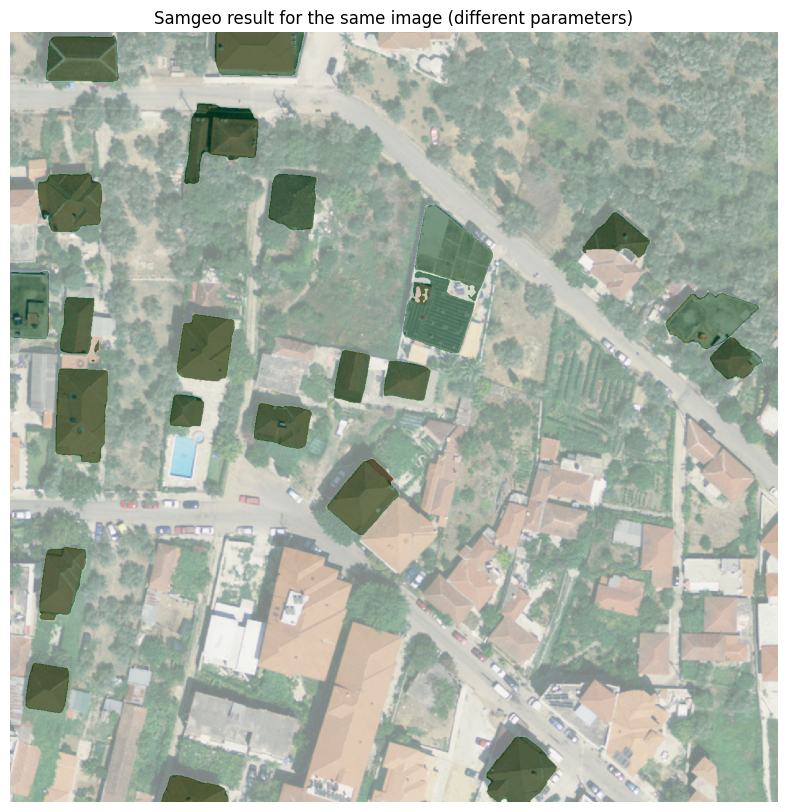

In [ ]:
samgeo.show_anns(
    cmap="Greens",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (different parameters)",
)

In [ ]:
samgeo.predict(image_path, prompt, text_threshold = 0.27, box_threshold=0.27)

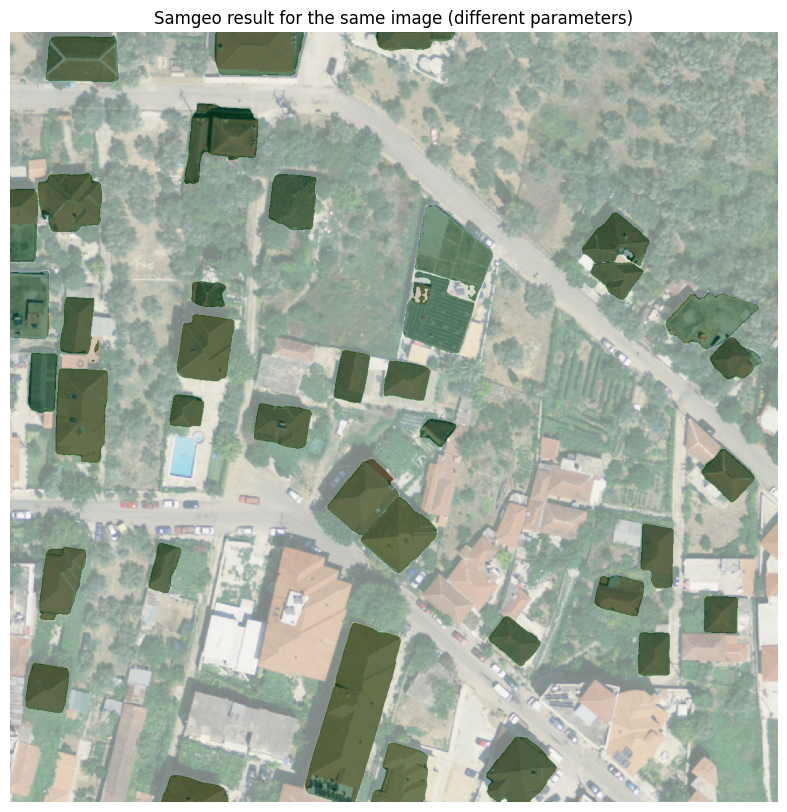

In [ ]:
samgeo.show_anns(
    cmap="Greens",
    add_boxes=False,
    alpha=0.5,
    title="Samgeo result for the same image (different parameters)",
)